In [1]:
import sys

# _NOTEBOOK_DIR : contains rephrase_plot_utils.py
# _GIDON_SCRIPTS: contains tfsplt_future_past_utils.py (select_lag_range_and_last_columns)
#                 and tfsplt_future_past_helpers.py
_NOTEBOOK_DIR  = '/scratch/gpfs/HASSON/ij9216/projects/code/247/247-plotting/scripts/gidon'
_GIDON_SCRIPTS = '/scratch/gpfs/HASSON/gidon/247-plotting/scripts'
for _p in [_GIDON_SCRIPTS, _NOTEBOOK_DIR]:
    if _p not in sys.path:
        sys.path.insert(0, _p)

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Compat patch: matplotlib >= 3.9 rejects ax.set_title(..., color=None).
# Gidon's plot_effect_glassbrain passes color=None when no style color applies.
# Drop the kwarg silently so the default color is used instead.
_orig_axes_set_title = matplotlib.axes.Axes.set_title
def _compat_set_title(self, label, *args, **kwargs):
    if 'color' in kwargs and kwargs['color'] is None:
        del kwargs['color']
    return _orig_axes_set_title(self, label, *args, **kwargs)
matplotlib.axes.Axes.set_title = _compat_set_title

import argparse
import pandas as pd
import numpy as np
import importlib

import tfsplt_future_past_utils as pu
import rephrase_plot_utils as ru
from tfsplt_future_past_helpers import render_brainplot_panels

## Parameters

In [2]:
class Args(argparse.Namespace):
    rois = [
        "IFG", "MTG", "STG", "preCG", "postCG",
        "rostralmiddlefrontal", "superiorfrontal", "supramarginal",
        "ITG", "TP", "fusiform", "All",
    ]
    lines   = ["joint", "word", "sentence", "sentence2"]
    # Matches plot_word_rephrases.ipynb for now: original=black,
    # paraphrase(Form)=blue, rcw(Meaning)=orange, parandom=grey.
    colors  = ["black", "#2196F3", "#FF5722", "#9E9E9E"]
    legends = ["joint", "word", "future", "past"]
    lags = {
        "lags_all":       np.arange(-2000, 2001, 50),
        "lags_plt":       np.arange(-2000, 2001, 50),
        "lag_ticks":      np.arange(-2000, 2001, 500),
        "lag_tick_labels": np.arange(-2, 2.001, 0.5),
    }
    res_dir = '/scratch/gpfs/HASSON/ij9216/projects/code/247/247-plotting/results/figures'

args = Args()

## Load data

Conditions compared:
| Key | Description |
|---|---|
| `original` | Original sentences |
| `paraphrase` | Paraphrase — wording changed, meaning preserved ("Form") |
| `rcw` | Random content words — content words randomized, structure preserved ("Meaning") |
| `parandom` | Paraphrase + RCW combined — both form and meaning changed ("Form + Meaning", double-rephrase) |
| `shuffled` | Shuffled embeddings — null baseline, used only as an alternate size-encoding denominator below |

In [3]:
importlib.reload(pu)
importlib.reload(ru)

res_d        = "/scratch/gpfs/HASSON/gidon/247-encoding-dev/results/tfs"
res_d_itamar = "/scratch/gpfs/HASSON/ij9216/projects/code/247/247-encoding-dev/results/tfs"
LAG_MIN, LAG_MAX = -2000, 2000

def _load(path_template, mode):
    df = pu.load_res_add_roi_threshold(path_template, thresh=None)
    df = pu.select_lag_range_and_last_columns(df, LAG_MIN, LAG_MAX)
    df['label3'] = df['label3'].str.replace('_banded_', '', regex=False)
    print(f"  {'comp' if mode == 'comp' else 'prod'}: {len(df)} rows")
    return df

# ---------- Original ----------
print("Original:")
_orig_tmpl = (
    f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-"
    "original_pca300_drop-short_mistral_original_word_trained_sentence_cnxt_0008"
)
original_c = _load(_orig_tmpl + "_comp.csv", 'comp')
original_p = _load(_orig_tmpl + "_prod.csv", 'prod')

# ---------- Paraphrase (Form) ----------
print("Paraphrase (Form):")
_para_tmpl = (
    f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-"
    "paraphrase_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008"
)
paraphrase_c = _load(_para_tmpl + "_comp.csv", 'comp')
paraphrase_p = _load(_para_tmpl + "_prod.csv", 'prod')

# ---------- Random content words (Meaning) ----------
print("Random content words (Meaning):")
_rcw_tmpl = (
    f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-"
    "random_content_words_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008"
)
rcw_c = _load(_rcw_tmpl + "_comp.csv", 'comp')
rcw_p = _load(_rcw_tmpl + "_prod.csv", 'prod')

# ---------- Paraphrase + RCW (Form + Meaning, double-rephrase) ----------
print("Form + Meaning (double-rephrase):")
_parandom_tmpl = (
    f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-"
    "paraphrase_rephrased_random_content_words_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008"
)
parandom_c = _load(_parandom_tmpl + "_comp.csv", 'comp')
parandom_p = _load(_parandom_tmpl + "_prod.csv", 'prod')

# ---------- Shuffled (null baseline; alternate size-encoding denominator) ----------
print("Shuffled (null baseline):")
_shuffled_tmpl = (
    f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag120k-50-all-static_future_past-"
    "shuffled_drop-short_mistral"
)
shuffled_c = _load(_shuffled_tmpl + "_comp.csv", 'comp')
shuffled_p = _load(_shuffled_tmpl + "_prod.csv", 'prod')

Original:
  comp: 2592 rows
  prod: 2592 rows
Paraphrase (Form):
  comp: 2636 rows
  prod: 2640 rows
Random content words (Meaning):
  comp: 2620 rows
  prod: 2620 rows
Form + Meaning (double-rephrase):
  comp: 2628 rows
  prod: 2628 rows
Shuffled (null baseline):
  comp: 2636 rows
  prod: 2624 rows


## Electrode selection

Electrodes are selected based on **joint_max** (peak joint-model performance over
lags −2000 to +2000 ms) in the **original** condition ≥ 0.1.
The same electrode set is then applied to the four core conditions
(`original`, `paraphrase`, `rcw`, `parandom`) via inner intersection.

`shuffled` is loaded separately and is only merged in inside `compute_brainplot_scores`
for the alternate ("Version B") size-encoding brainplots below — it is not part of the
lineplot conditions.

In [4]:
CONDITION_NAMES = ["original", "paraphrase", "rcw", "parandom"]
JOINT_MAX_THRESH = 0.1

condition_dfs_c = {
    "original":   original_c,
    "paraphrase": paraphrase_c,
    "rcw":        rcw_c,
    "parandom":   parandom_c,
}
condition_dfs_p = {
    "original":   original_p,
    "paraphrase": paraphrase_p,
    "rcw":        rcw_p,
    "parandom":   parandom_p,
}

# align_lag_columns so select_electrodes_by_joint_max can find numeric columns.
# shuffled is aligned here too so it's ready for the Version B brainplots later.
lag_cols = np.arange(LAG_MIN, LAG_MAX + 50, 50)
ru.align_lag_columns(list(condition_dfs_c.values()) + [shuffled_c], lag_cols)
ru.align_lag_columns(list(condition_dfs_p.values()) + [shuffled_p], lag_cols)

selected_elecs_c = ru.select_electrodes_by_joint_max(
    original_c, threshold=JOINT_MAX_THRESH
)
selected_elecs_p = ru.select_electrodes_by_joint_max(
    original_p, threshold=JOINT_MAX_THRESH
)

filtered_c, common_c = ru.intersect_conditions(condition_dfs_c, selected_elecs_c)
filtered_p, common_p = ru.intersect_conditions(condition_dfs_p, selected_elecs_p)

print(f"Comprehension: {len(selected_elecs_c)} pass joint_max≥{JOINT_MAX_THRESH}, "
      f"{len(common_c)} shared across all 4 conditions")
print(f"Production:    {len(selected_elecs_p)} pass joint_max≥{JOINT_MAX_THRESH}, "
      f"{len(common_p)} shared across all 4 conditions")

roi_results_c = ru.build_roi_results(filtered_c, CONDITION_NAMES, args.rois)
roi_results_p = ru.build_roi_results(filtered_p, CONDITION_NAMES, args.rois)

Comprehension: 276 pass joint_max≥0.1, 270 shared across all 4 conditions
Production:    276 pass joint_max≥0.1, 273 shared across all 4 conditions


---
## Lineplots

One figure per ROI with two subplots — **future** (`sentence` band) and **past**
(`sentence2` band) — showing all four conditions overlaid.
Electrodes are the same in every condition (joint_max-selected, intersected).

### Comprehension

IFG: 38 electrodes


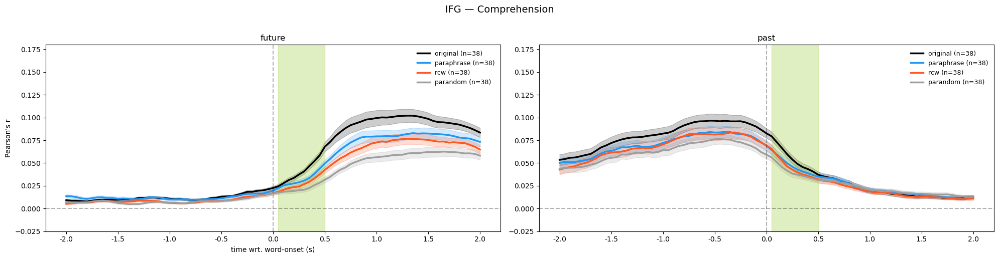

MTG: 17 electrodes


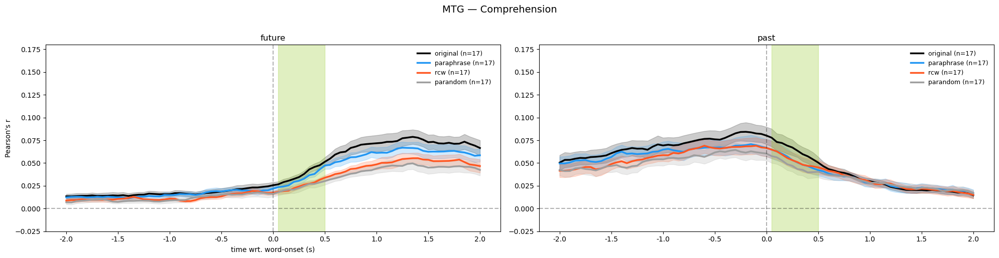

STG: 29 electrodes


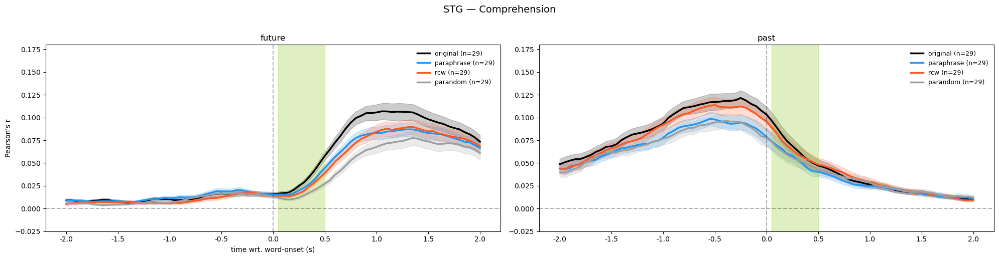

preCG: 22 electrodes


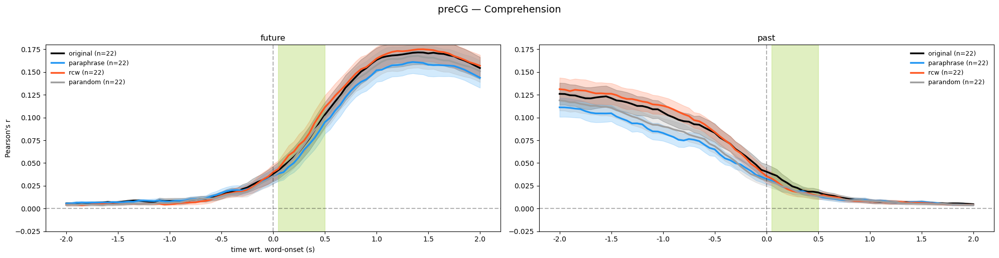

postCG: 13 electrodes


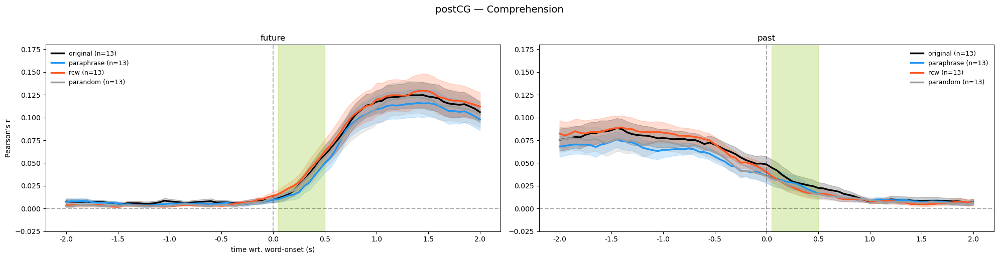

rostralmiddlefrontal: 21 electrodes


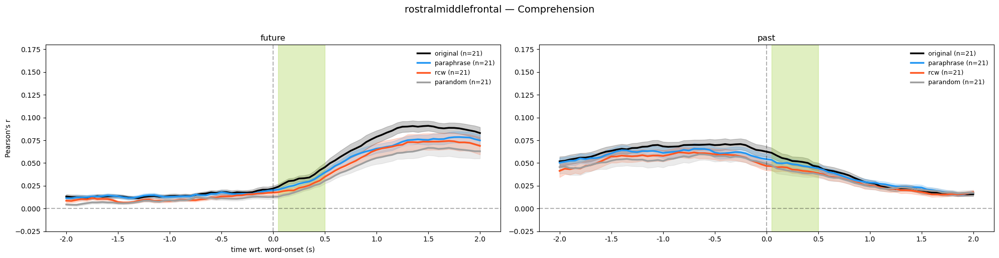

superiorfrontal: 9 electrodes


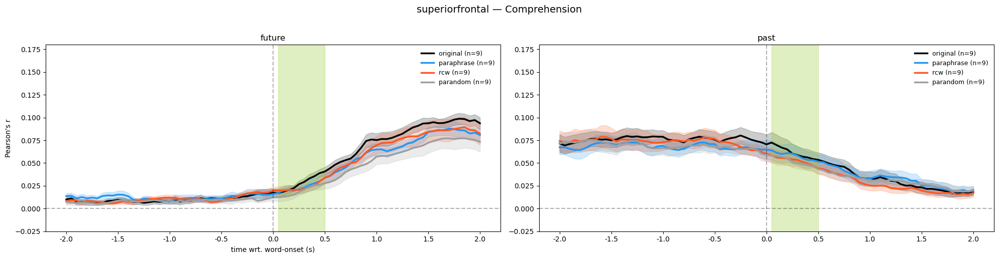

supramarginal: 14 electrodes


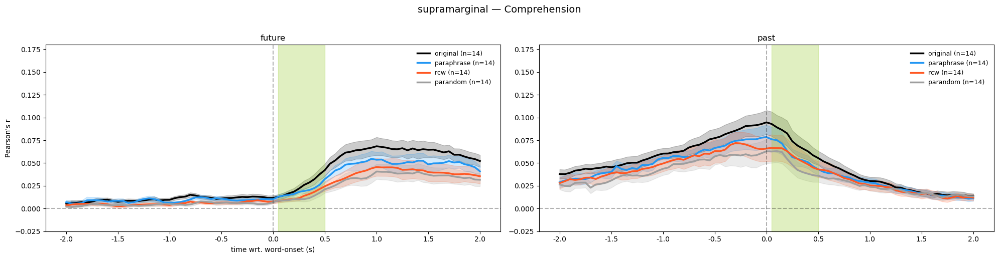

ITG: 8 electrodes


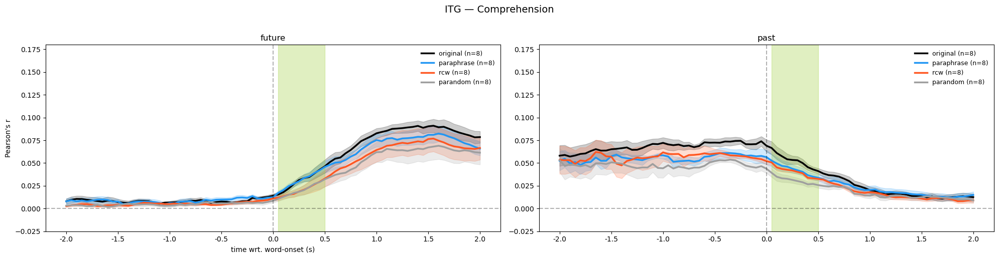

TP: 6 electrodes


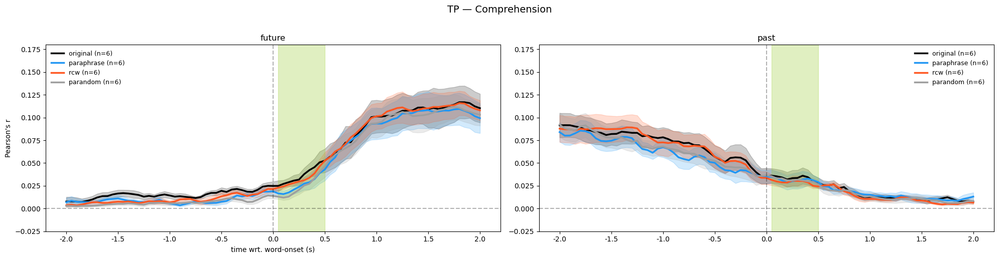

fusiform: 7 electrodes


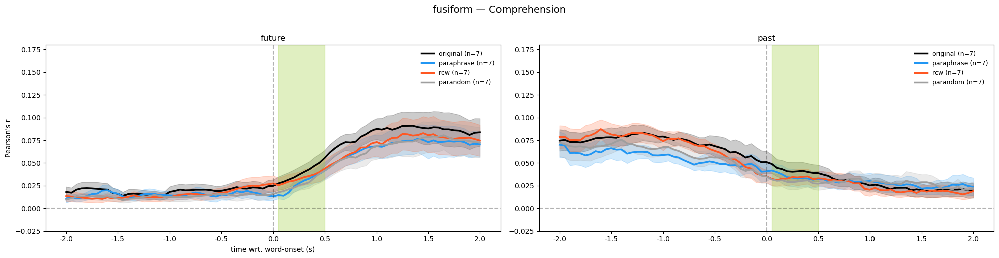

All: 274 electrodes


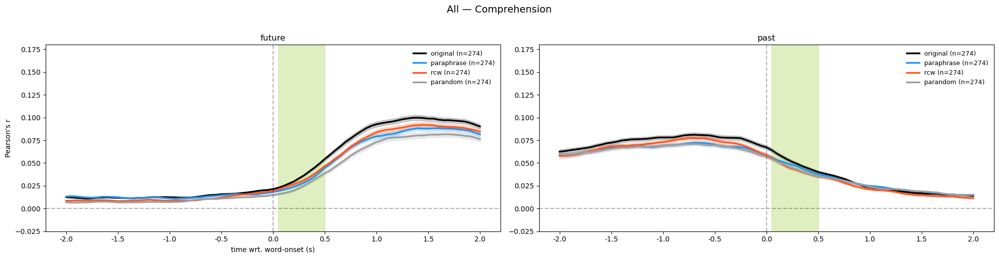

In [5]:
rois_to_plot_c = [
    roi for roi in args.rois
    if roi_results_c.get((0, 'sentence', roi)) is not None
    and len(roi_results_c[(0, 'sentence', roi)]) > 2
]

for roi in rois_to_plot_c:
    n_elecs = len(roi_results_c.get((0, 'sentence', roi), []))
    print(f"{roi}: {n_elecs} electrodes")
    ru.plot_rephrase_lineplots(
        args, roi_results_c, roi, CONDITION_NAMES, mode='comp',
        bands=['sentence', 'sentence2'],
    )

### Production

IFG: 44 electrodes


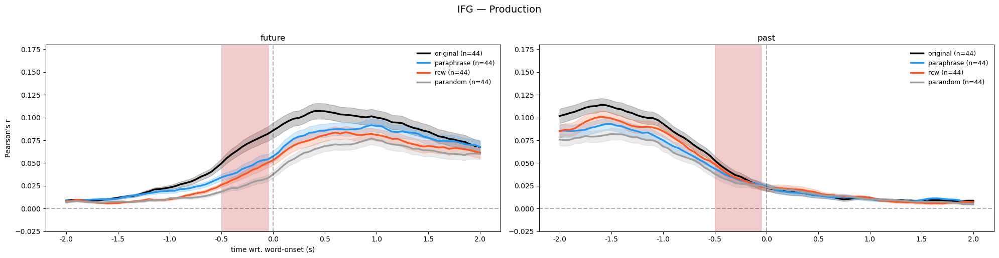

MTG: 20 electrodes


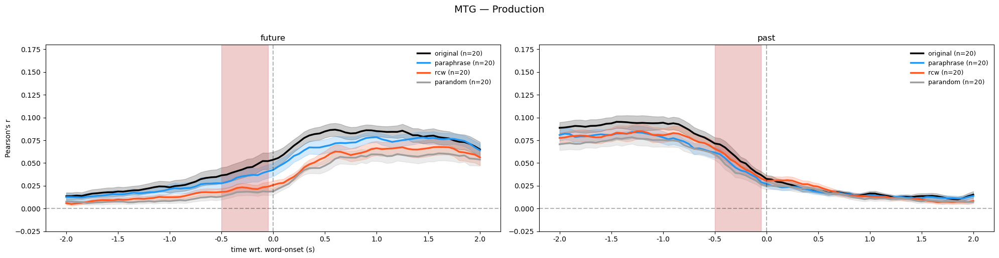

STG: 30 electrodes


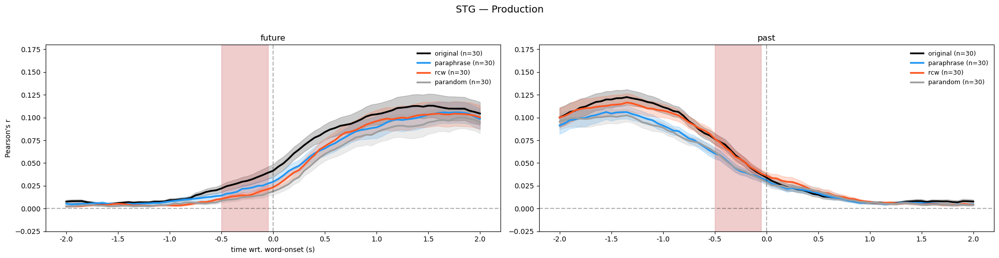

preCG: 24 electrodes


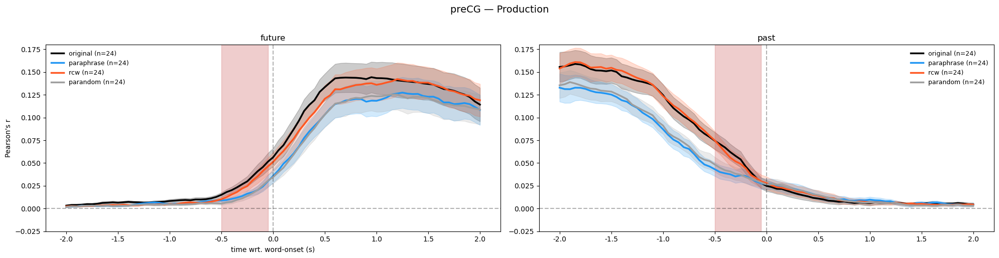

postCG: 21 electrodes


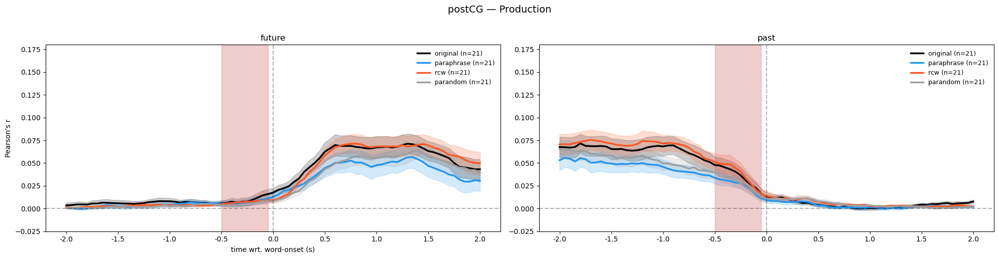

rostralmiddlefrontal: 19 electrodes


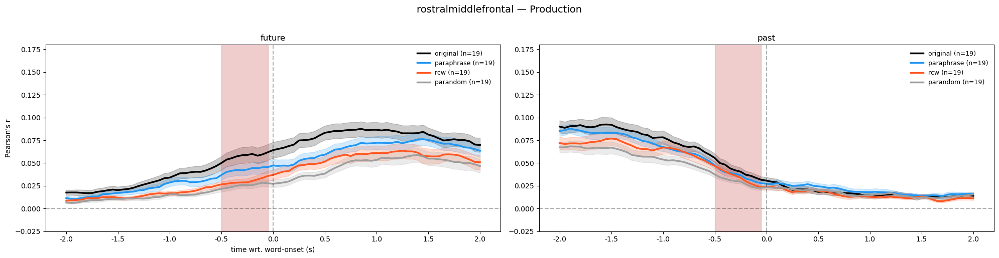

superiorfrontal: 7 electrodes


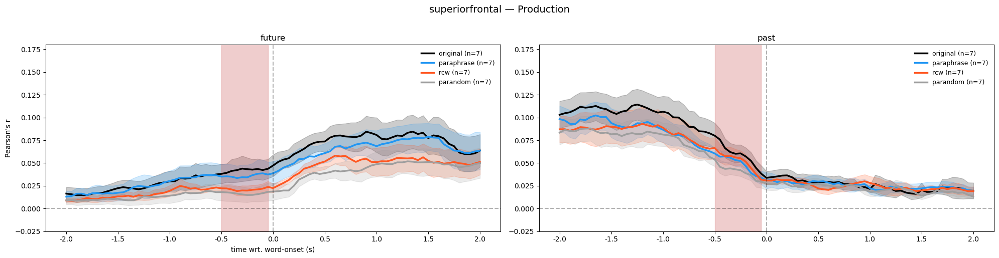

supramarginal: 9 electrodes


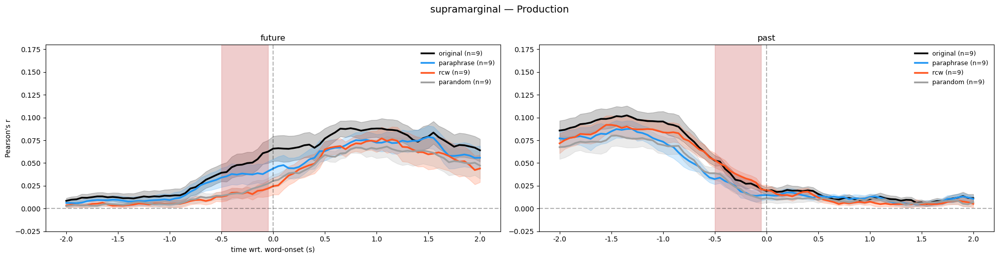

ITG: 10 electrodes


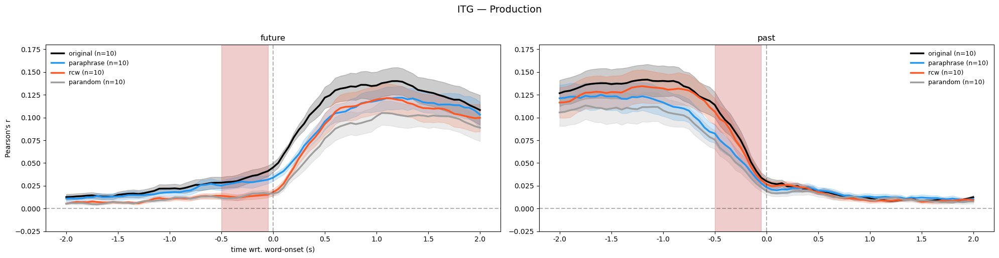

TP: 8 electrodes


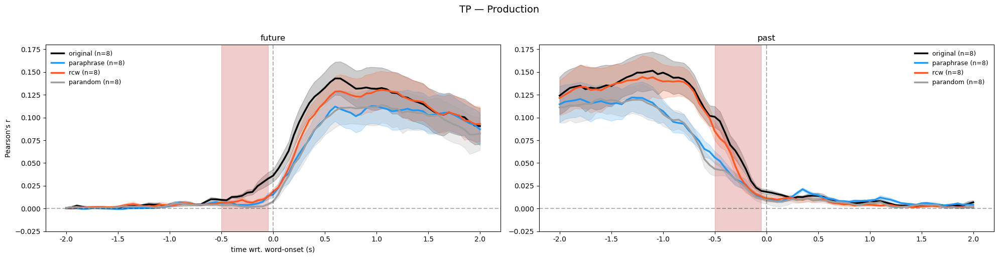

fusiform: 7 electrodes


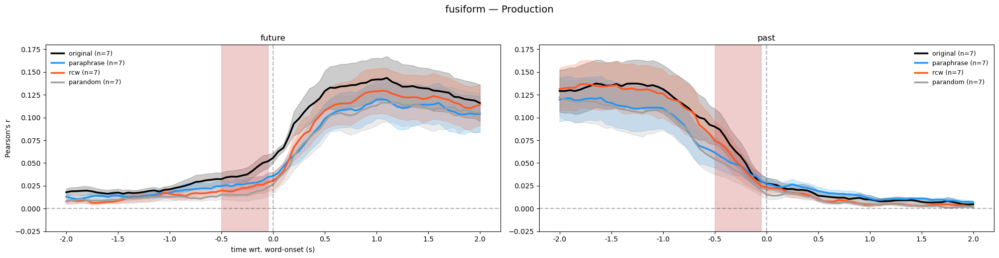

All: 287 electrodes


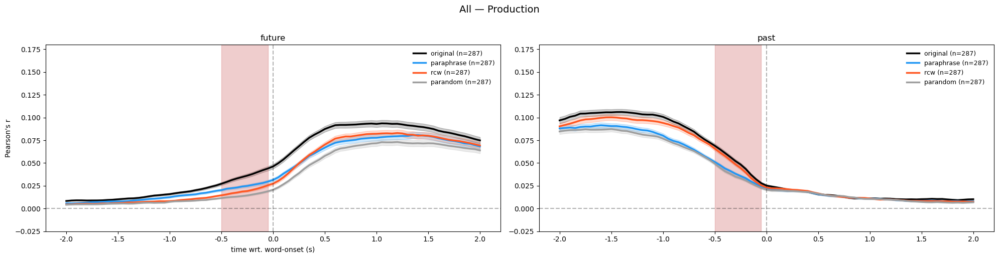

In [6]:
rois_to_plot_p = [
    roi for roi in args.rois
    if roi_results_p.get((0, 'sentence', roi)) is not None
    and len(roi_results_p[(0, 'sentence', roi)]) > 2
]

for roi in rois_to_plot_p:
    n_elecs = len(roi_results_p.get((0, 'sentence', roi), []))
    print(f"{roi}: {n_elecs} electrodes")
    ru.plot_rephrase_lineplots(
        args, roi_results_p, roi, CONDITION_NAMES, mode='prod',
        bands=['sentence', 'sentence2'],
    )

---
## Brainplots

**Color** encodes **Form (paraphrase) vs Meaning (RCW)** (per-electrode % change at
peak difference). Colors match `plot_word_rephrases.ipynb` for now:
- Blue (`#2196F3`) → paraphrase > RCW → electrode sensitive to **meaning**
  (encoding survives when form is disrupted but meaning is kept → must be tracking meaning)
- Orange (`#FF5722`) → paraphrase < RCW → electrode sensitive to **form**
  (encoding survives when meaning is disrupted but form/structure is kept → must be tracking form)

**Size** encodes how disrupted the electrode is by full rephrasing. Two versions below
use different denominators for size (and for percent-change normalization), and each
panel's on-plot size legend names the actual pair used:
- **Version A** — `original` vs `parandom` (Form+Meaning double-rephrase), matching the
  original Form/Meaning brainmap notebook (`tfsplt_future_past_reph_cnxt_0008_updated.ipynb`).
- **Version B** — `original` vs `shuffled` (null baseline), matching the word-rephrase
  notebook's convention (`plot_word_rephrases.ipynb`).

**Panels:** comprehension/production × future (`sentence` band, −1000→0 ms) / past
(`sentence2` band, 0→+1000 ms).

**Electrode inclusion** (all must pass):
- `original` joint max ≥ 0.1 over [−1000, +1000 ms]
- `original` band max ≥ 0.03 in the panel's own window (future window for `sentence`,
  past window for `sentence2`)
- `|orig − paraphrase|` ≥ 0.01 **or** `|orig − rcw|` ≥ 0.01 (rephrasing must measurably
  change the encoding for at least one of Form/Meaning — excludes electrodes where
  rephrasing had no effect at all, while keeping electrodes where Form and Meaning shift
  similarly relative to original)

In [7]:
lag_cols = np.arange(LAG_MIN, LAG_MAX + 50, 50)

time_window_future = [int(c) for c in lag_cols if -1000 <= c <= 0]
time_window_past   = [int(c) for c in lag_cols if 0 <= c <= 1000]
time_window_full   = [int(c) for c in lag_cols if -1000 <= c <= 1000]

time_windows = {
    ("comp", "sentence"):  time_window_future,
    ("comp", "sentence2"): time_window_past,
    ("prod", "sentence"):  time_window_future,
    ("prod", "sentence2"): time_window_past,
}

plot_order = [
    ("comp", "sentence",  "Comprehension - Future"),
    ("comp", "sentence2", "Comprehension - Past"),
    ("prod", "sentence",  "Production - Future"),
    ("prod", "sentence2", "Production - Past"),
]

# ---------- Score settings ----------
COLOR_PAIR = ("paraphrase", "rcw")   # Blue = paraphrase > rcw -> meaning-sensitive
SCORE_MODE = "percent_change_at_max_diff"
SIZE_MODE  = "max_abs_diff"
TOP_N_LAGS = 10
SIZE_MIN, SIZE_MAX = 10, 90

VALUE_THRESHOLDS       = {"original": 0.1}
THRESHOLD_TIME_WINDOWS = {"original": time_window_full}
BAND_THRESHOLDS = {
    "sentence":  {"value": 0.03, "cols": time_window_future},
    "sentence2": {"value": 0.03, "cols": time_window_past},
}

# Rephrase-effect floor: require a measurable shift from original for at least
# one of the two rephrase types (OR semantics -- see plot_word_rephrases.ipynb
# for the analogous word-level threshold and its rationale).
DIFF_MIN = 0.01
MIN_DIFF_ANY = [
    ("original", "paraphrase", DIFF_MIN),
    ("original", "rcw",        DIFF_MIN),
]

# Colors match plot_word_rephrases.ipynb for now: orange -> grey -> blue,
# i.e. positive score (paraphrase > rcw) -> blue = meaning-sensitive.
cmaps = {
    "sentence":  ru.paronym_grey_synonym_cmap("sentence_cmap"),
    "sentence2": ru.paronym_grey_synonym_cmap("sentence2_cmap"),
}
colorbar_labels = {
    "sentence":  "Blue = meaning, orange = form",
    "sentence2": "Blue = meaning, orange = form",
}

print("=== Brainplot settings ===")
print(f"  Color pair : {COLOR_PAIR[0]} vs {COLOR_PAIR[1]}")
print(f"  Score mode : {SCORE_MODE}  |  Top N lags: {TOP_N_LAGS}")
print(f"  Joint threshold      : original max >= {VALUE_THRESHOLDS['original']} "
      f"over {time_window_full[0]}..{time_window_full[-1]} ms")
print("  Band thresholds      : sentence/sentence2 original max >= 0.03 in own window")
print(f"  Rephrase-effect floor: |orig-paraphrase| >= {DIFF_MIN} OR |orig-rcw| >= {DIFF_MIN}")

=== Brainplot settings ===
  Color pair : paraphrase vs rcw
  Score mode : percent_change_at_max_diff  |  Top N lags: 10
  Joint threshold      : original max >= 0.1 over -1000..1000 ms
  Band thresholds      : sentence/sentence2 original max >= 0.03 in own window
  Rephrase-effect floor: |orig-paraphrase| >= 0.01 OR |orig-rcw| >= 0.01


### Version A: size = original vs Form+Meaning (parandom)

In [8]:
data_by_mode = {
    "comp": {
        "paraphrase": paraphrase_c,
        "rcw":        rcw_c,
        "original":   original_c,
        "parandom":   parandom_c,
    },
    "prod": {
        "paraphrase": paraphrase_p,
        "rcw":        rcw_p,
        "original":   original_p,
        "parandom":   parandom_p,
    },
}

SIZE_PAIR_A  = ("original", "parandom")
DENOM_PAIR_A = ("original", "parandom")

panel_scores_a = []
for mode, label3, desc in plot_order:
    cfg = data_by_mode[mode]
    tw  = time_windows[(mode, label3)]
    print(f"Computing scores (Version A): {desc} ({tw[0]}..{tw[-1]} ms)")
    scores = ru.compute_brainplot_scores(
        condition_dfs=cfg,
        label3=label3,
        time_window=tw,
        color_pair=COLOR_PAIR,
        value_thresholds=VALUE_THRESHOLDS,
        score_mode=SCORE_MODE,
        size_pair=SIZE_PAIR_A,
        size_time_window=tw,
        size_mode=SIZE_MODE,
        size_min=SIZE_MIN,
        size_max=SIZE_MAX,
        band_thresholds=BAND_THRESHOLDS,
        threshold_time_window=THRESHOLD_TIME_WINDOWS,
        denominator_pair=DENOM_PAIR_A,
        threshold_label3="joint",
        top_n_lags=TOP_N_LAGS,
        min_diff_any=MIN_DIFF_ANY,
    ).assign(mode=mode)
    print(f"  → {len(scores)} electrodes passed thresholds")
    panel_scores_a.append(scores)

electrode_scores_parandom = (
    pd.concat(panel_scores_a, ignore_index=True) if panel_scores_a else pd.DataFrame()
)
print(f"\nTotal electrode × panel rows: {len(electrode_scores_parandom)}")

Computing scores (Version A): Comprehension - Future (-1000..0 ms)
  → 44 electrodes passed thresholds
Computing scores (Version A): Comprehension - Past (0..1000 ms)
  → 175 electrodes passed thresholds
Computing scores (Version A): Production - Future (-1000..0 ms)
  → 167 electrodes passed thresholds
Computing scores (Version A): Production - Past (0..1000 ms)
  → 76 electrodes passed thresholds

Total electrode × panel rows: 462


462 total rows -> 456 with known coords
score_mode=percent_change_at_max_diff | n_total=456
    → Comprehension - Future: 42 electrodes plotted: ['625_EEGAT_01REF', '625_EEGAT_03REF', '625_EEGBPT_01REF', '625_EEGBPT_02REF', '625_EEGGR_05REF', '625_EEGGR_15REF', '625_EEGGR_59REF', '676_EEGAT_02REF', '676_EEGDPMT_04REF', '676_EEGG_07REF', '676_EEGG_44REF', '676_EEGG_47REF', '7170_DLAL7', '7170_DLAMT8', '7170_DLPL1', '7170_DLPL3', '7170_DRAI4', '7170_DRAMT6', '7170_DRPMT1', '7170_LGA1', '7170_LGA11', '7170_LGA19', '7170_LGB120', '7170_LGB125', '7170_LGB77', '7170_ROF4', '798_AIT2', '798_DPI2', '798_G100', '798_G11', '798_G15', '798_G19', '798_G5', '798_G76', '798_G83', '798_IF3', '798_O5', '798_O7', '798_P5', '798_P6', '798_PIT2', '798_SF2']


/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(


    → Comprehension - Past: 174 electrodes plotted: ['625_EEGATO_01REF', '625_EEGAT_03REF', '625_EEGBPT_01REF', '625_EEGGR_03REF', '625_EEGGR_04REF', '625_EEGGR_13REF', '625_EEGGR_15REF', '625_EEGGR_19REF', '625_EEGGR_20REF', '625_EEGGR_22REF', '625_EEGGR_26REF', '625_EEGGR_27REF', '625_EEGGR_28REF', '625_EEGGR_29REF', '625_EEGGR_30REF', '625_EEGGR_37REF', '625_EEGGR_38REF', '625_EEGGR_46REF', '625_EEGGR_53REF', '625_EEGGR_54REF', '625_EEGGR_55REF', '625_EEGGR_59REF', '625_EEGGR_62REF', '625_EEGGR_63REF', '676_EEGAF_02REF', '676_EEGAF_03REF', '676_EEGAF_08REF', '676_EEGDAC_01REF', '676_EEGDAC_03REF', '676_EEGDAC_04REF', '676_EEGDAI_03REF', '676_EEGDPI_01REF', '676_EEGDPI_02REF', '676_EEGDPI_03REF', '676_EEGDPI_04REF', '676_EEGDPMT_04REF', '676_EEGG_01REF', '676_EEGG_02REF', '676_EEGG_03REF', '676_EEGG_05REF', '676_EEGG_07REF', '676_EEGG_09REF', '676_EEGG_11REF', '676_EEGG_17REF', '676_EEGG_18REF', '676_EEGG_21REF', '676_EEGG_32REF', '676_EEGG_34REF', '676_EEGG_35REF', '676_EEGG_36REF',

/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(


    → Production - Past: 75 electrodes plotted: ['625_EEGAT_04REF', '625_EEGGR_03REF', '625_EEGGR_04REF', '625_EEGGR_10REF', '625_EEGGR_11REF', '625_EEGGR_23REF', '625_EEGGR_31REF', '625_EEGGR_35REF', '625_EEGGR_37REF', '625_EEGGR_47REF', '676_EEGAF_02REF', '676_EEGDAC_02REF', '676_EEGDPI_01REF', '676_EEGDPI_02REF', '676_EEGG_15REF', '676_EEGG_25REF', '676_EEGG_26REF', '676_EEGG_45REF', '676_EEGG_56REF', '676_EEGG_59REF', '676_EEGMT_02REF', '7170_DLAI4', '7170_DLAL11', '7170_DLAL4', '7170_DLAL8', '7170_DLAMT7', '7170_DLPL1', '7170_DLPL5', '7170_DLPL7', '7170_DRAMT8', '7170_DRPI4', '7170_LF1', '7170_LGA11', '7170_LGA37', '7170_LGA38', '7170_LGA4', '7170_LGA7', '7170_LGB112', '7170_LGB113', '7170_LGB114', '7170_LGB119', '7170_LGB120', '7170_LGB121', '7170_LGB122', '7170_LGB126', '7170_LGB66', '7170_LGB70', '7170_LGB75', '7170_LGB81', '7170_LOF3', '7170_RAT2', '7170_RAT3', '7170_RAT5', '7170_ROF1', '798_AF1', '798_AIT1', '798_AIT3', '798_DPI2', '798_G100', '798_G113', '798_G12', '798_G16'

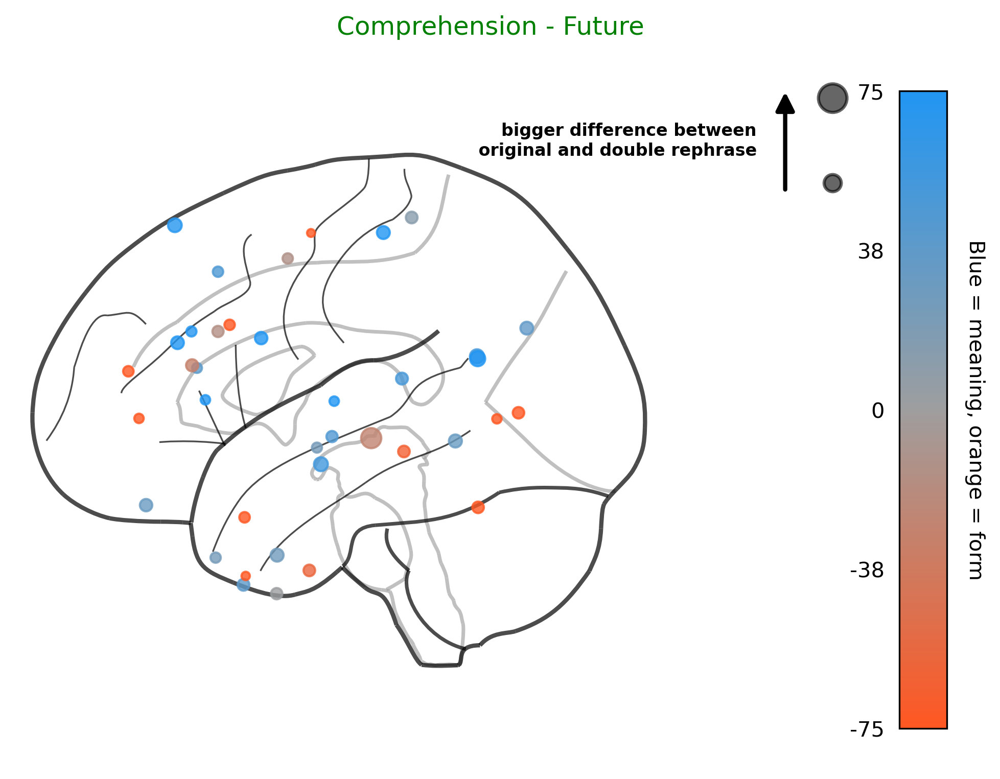

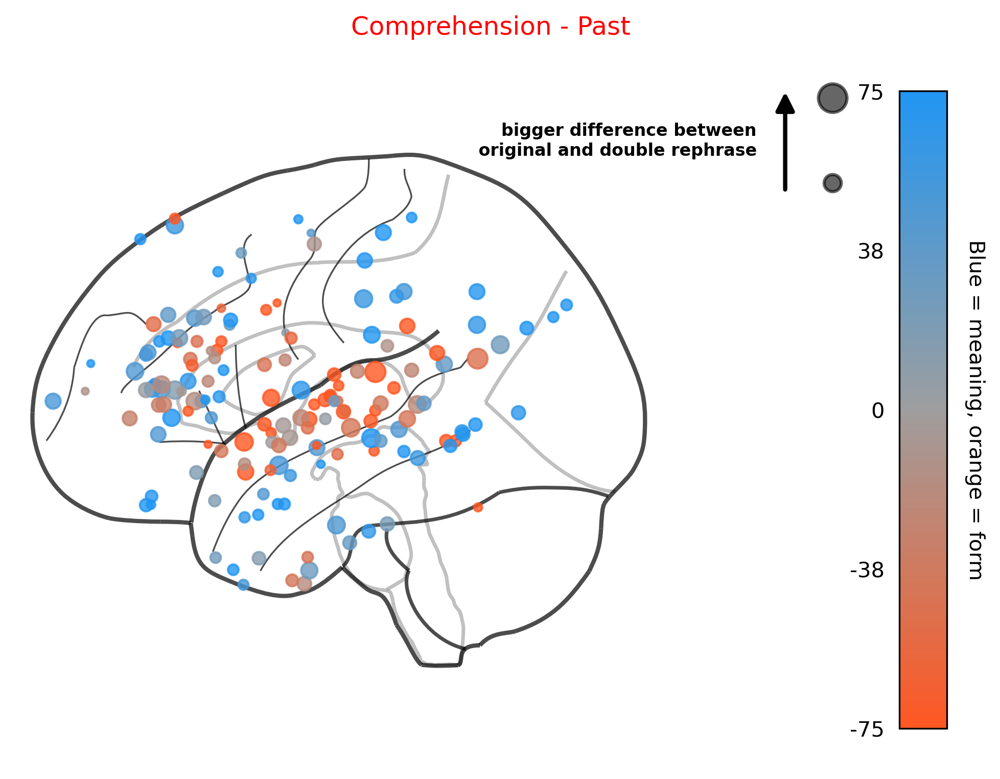

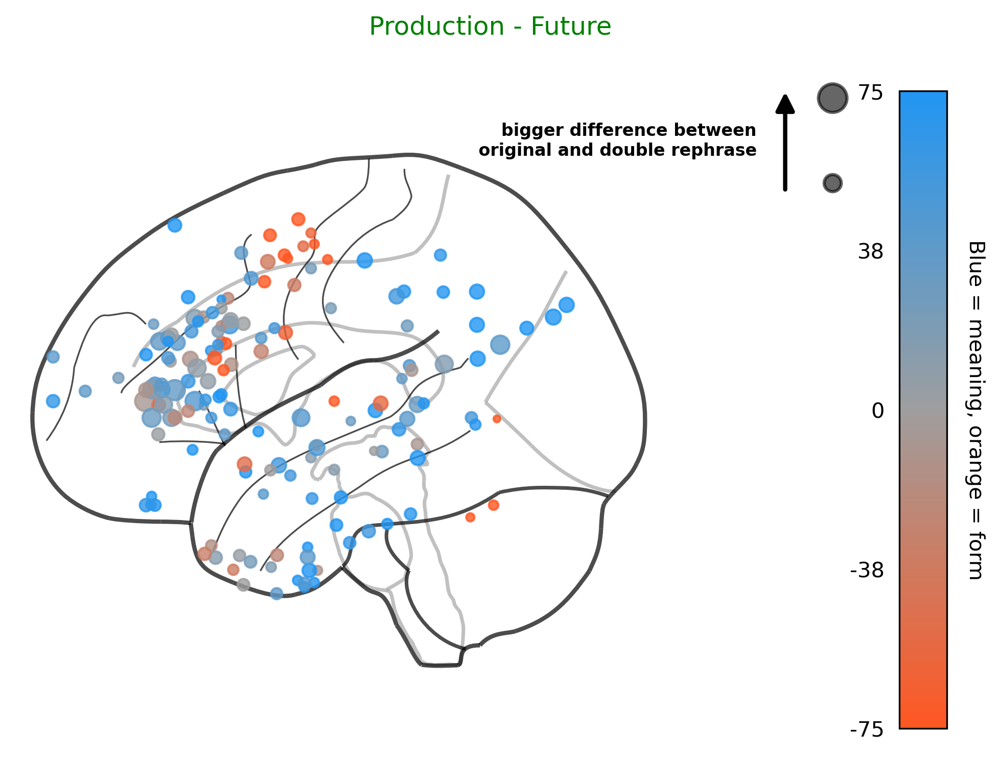

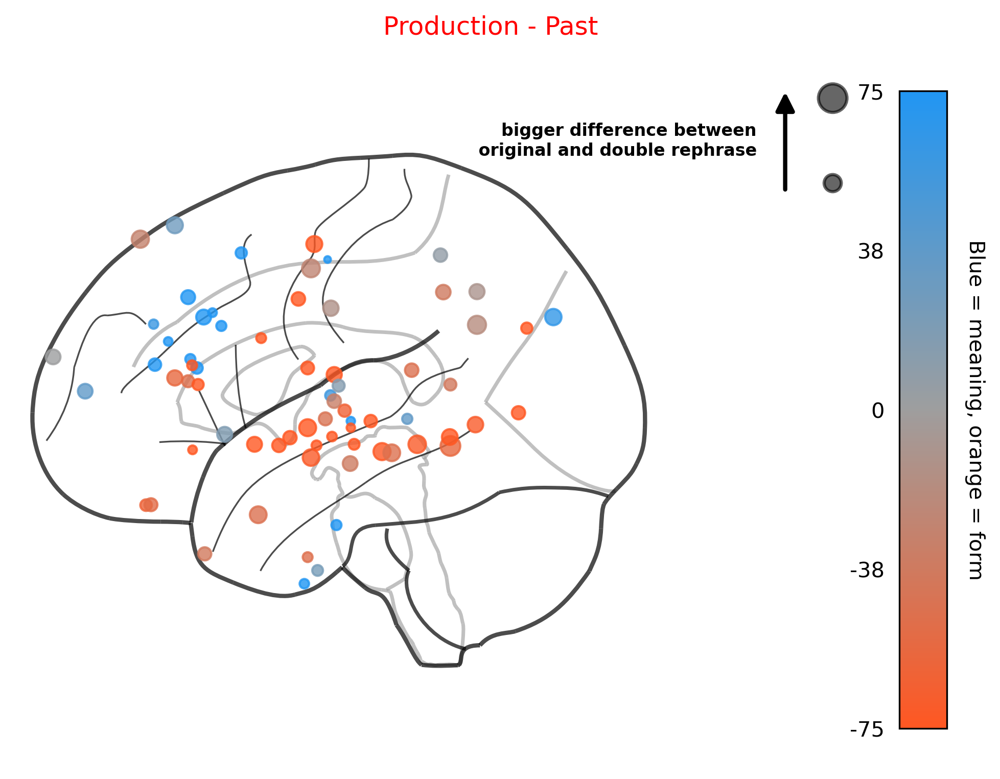

In [9]:
importlib.reload(ru)

# Keep only electrodes with known MNI coordinates.
# plot_effect_glassbrain does a left merge with the coordinate file, so
# unmatched electrodes get NaN MNI_X/Y/Z, which crashes nilearn's plot_markers.
electrode_scores_parandom_coords = ru.filter_to_known_coords(electrode_scores_parandom)
print(f"{len(electrode_scores_parandom)} total rows -> {len(electrode_scores_parandom_coords)} with known coords")

ru.render_rephrase_brainplot_panels(
    electrode_scores=electrode_scores_parandom_coords,
    plot_order=plot_order,
    cmaps=cmaps,
    colorbar_labels=colorbar_labels,
    score_mode=SCORE_MODE,
    size_pair_labels=("original", "double rephrase"),
    use_size_encoding=True,
)

### Version B: size = original vs shuffled (null baseline)

In [10]:
data_by_mode_shuffled = {
    "comp": {**data_by_mode["comp"], "shuffled": shuffled_c},
    "prod": {**data_by_mode["prod"], "shuffled": shuffled_p},
}

SIZE_PAIR_B  = ("original", "shuffled")
DENOM_PAIR_B = ("original", "shuffled")

panel_scores_b = []
for mode, label3, desc in plot_order:
    cfg = data_by_mode_shuffled[mode]
    tw  = time_windows[(mode, label3)]
    print(f"Computing scores (Version B): {desc} ({tw[0]}..{tw[-1]} ms)")
    scores = ru.compute_brainplot_scores(
        condition_dfs=cfg,
        label3=label3,
        time_window=tw,
        color_pair=COLOR_PAIR,
        value_thresholds=VALUE_THRESHOLDS,
        score_mode=SCORE_MODE,
        size_pair=SIZE_PAIR_B,
        size_time_window=tw,
        size_mode=SIZE_MODE,
        size_min=SIZE_MIN,
        size_max=SIZE_MAX,
        band_thresholds=BAND_THRESHOLDS,
        threshold_time_window=THRESHOLD_TIME_WINDOWS,
        denominator_pair=DENOM_PAIR_B,
        threshold_label3="joint",
        top_n_lags=TOP_N_LAGS,
        min_diff_any=MIN_DIFF_ANY,
    ).assign(mode=mode)
    print(f"  → {len(scores)} electrodes passed thresholds")
    panel_scores_b.append(scores)

electrode_scores_shuffled_v = (
    pd.concat(panel_scores_b, ignore_index=True) if panel_scores_b else pd.DataFrame()
)
print(f"\nTotal electrode × panel rows: {len(electrode_scores_shuffled_v)}")

Computing scores (Version B): Comprehension - Future (-1000..0 ms)
  → 44 electrodes passed thresholds
Computing scores (Version B): Comprehension - Past (0..1000 ms)
  → 175 electrodes passed thresholds
Computing scores (Version B): Production - Future (-1000..0 ms)
  → 167 electrodes passed thresholds
Computing scores (Version B): Production - Past (0..1000 ms)
  → 76 electrodes passed thresholds

Total electrode × panel rows: 462


462 total rows -> 456 with known coords
score_mode=percent_change_at_max_diff | n_total=456
    → Comprehension - Future: 42 electrodes plotted: ['625_EEGAT_01REF', '625_EEGAT_03REF', '625_EEGBPT_01REF', '625_EEGBPT_02REF', '625_EEGGR_05REF', '625_EEGGR_15REF', '625_EEGGR_59REF', '676_EEGAT_02REF', '676_EEGDPMT_04REF', '676_EEGG_07REF', '676_EEGG_44REF', '676_EEGG_47REF', '7170_DLAL7', '7170_DLAMT8', '7170_DLPL1', '7170_DLPL3', '7170_DRAI4', '7170_DRAMT6', '7170_DRPMT1', '7170_LGA1', '7170_LGA11', '7170_LGA19', '7170_LGB120', '7170_LGB125', '7170_LGB77', '7170_ROF4', '798_AIT2', '798_DPI2', '798_G100', '798_G11', '798_G15', '798_G19', '798_G5', '798_G76', '798_G83', '798_IF3', '798_O5', '798_O7', '798_P5', '798_P6', '798_PIT2', '798_SF2']
    → Comprehension - Past: 174 electrodes plotted: ['625_EEGATO_01REF', '625_EEGAT_03REF', '625_EEGBPT_01REF', '625_EEGGR_03REF', '625_EEGGR_04REF', '625_EEGGR_13REF', '625_EEGGR_15REF', '625_EEGGR_19REF', '625_EEGGR_20REF', '625_EEGGR_22REF', '625_E

/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(


    → Production - Future: 165 electrodes plotted: ['625_EEGAT_01REF', '625_EEGAT_02REF', '625_EEGAT_03REF', '625_EEGAT_04REF', '625_EEGAT_05REF', '625_EEGBPT_01REF', '625_EEGBPT_02REF', '625_EEGBPT_03REF', '625_EEGDAMT_01REF', '625_EEGGR_03REF', '625_EEGGR_04REF', '625_EEGGR_10REF', '625_EEGGR_11REF', '625_EEGGR_13REF', '625_EEGGR_19REF', '625_EEGGR_20REF', '625_EEGGR_21REF', '625_EEGGR_22REF', '625_EEGGR_23REF', '625_EEGGR_26REF', '625_EEGGR_30REF', '625_EEGGR_31REF', '625_EEGGR_35REF', '625_EEGGR_41REF', '625_EEGGR_47REF', '625_EEGGR_49REF', '625_EEGGR_50REF', '625_EEGGR_55REF', '625_EEGGR_58REF', '625_EEGGR_59REF', '625_EEGGR_60REF', '625_EEGGR_63REF', '676_EEGAF_01REF', '676_EEGAF_02REF', '676_EEGAF_03REF', '676_EEGAT_01REF', '676_EEGDAC_01REF', '676_EEGDAC_02REF', '676_EEGDAC_03REF', '676_EEGDAC_04REF', '676_EEGDAC_10REF', '676_EEGDAI_04REF', '676_EEGDAMT_07REF', '676_EEGG_01REF', '676_EEGG_02REF', '676_EEGG_03REF', '676_EEGG_04REF', '676_EEGG_05REF', '676_EEGG_06REF', '676_EEGG_

/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(


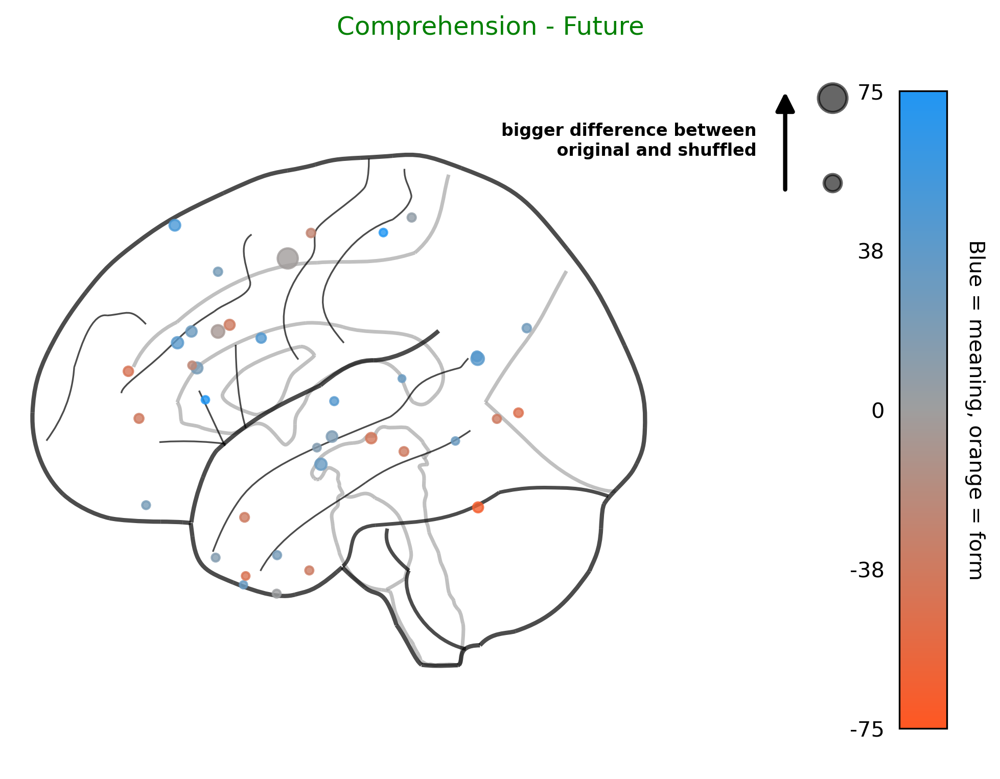

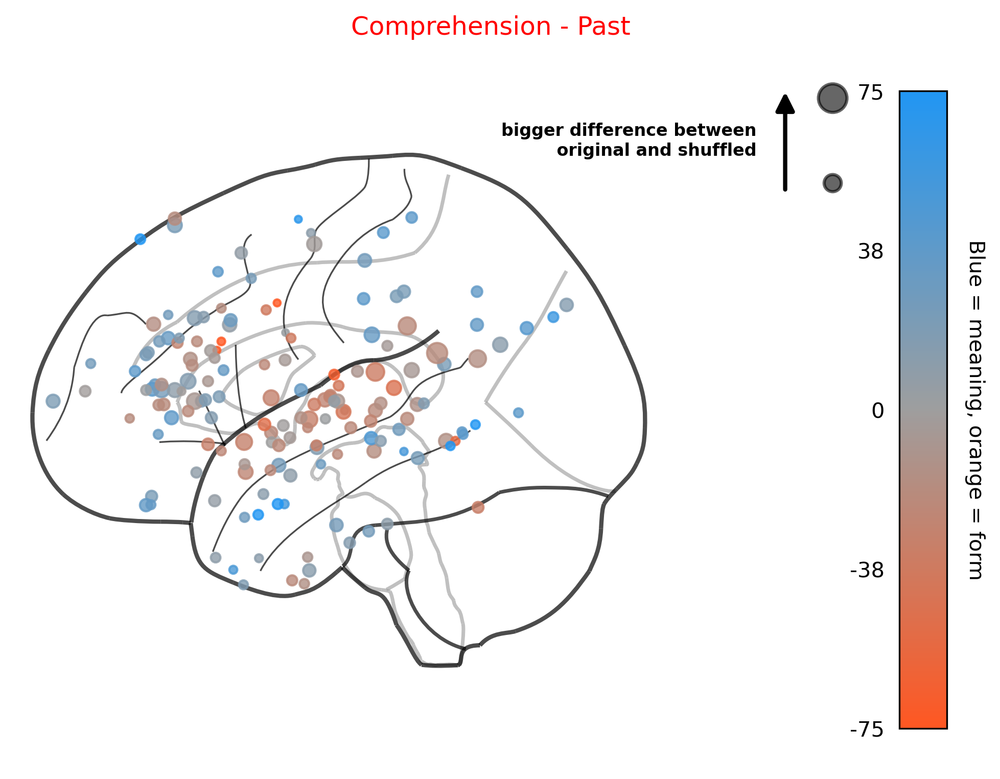

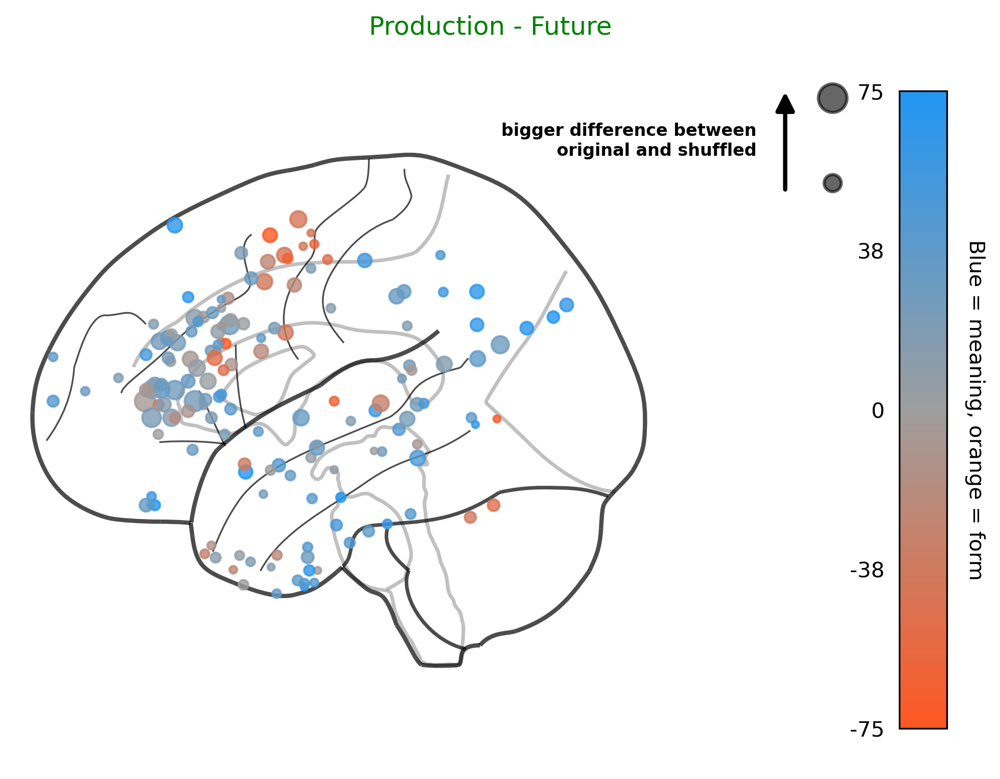

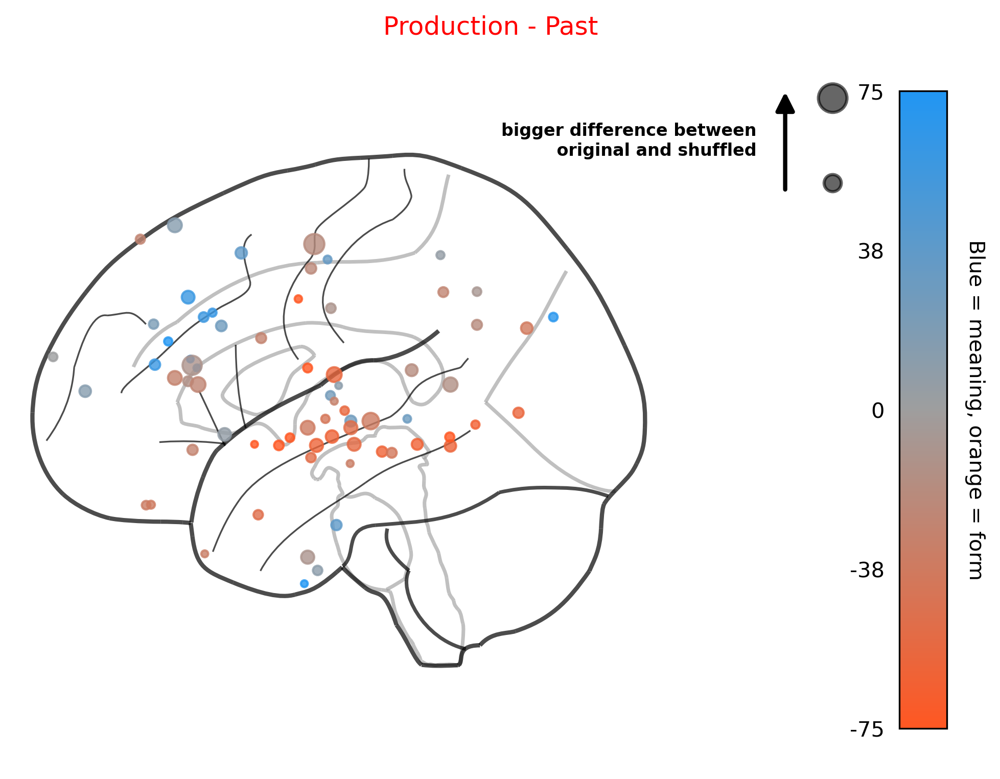

In [11]:
importlib.reload(ru)

electrode_scores_shuffled_coords = ru.filter_to_known_coords(electrode_scores_shuffled_v)
print(f"{len(electrode_scores_shuffled_v)} total rows -> {len(electrode_scores_shuffled_coords)} with known coords")

ru.render_rephrase_brainplot_panels(
    electrode_scores=electrode_scores_shuffled_coords,
    plot_order=plot_order,
    cmaps=cmaps,
    colorbar_labels=colorbar_labels,
    score_mode=SCORE_MODE,
    size_pair_labels=("original", "shuffled"),
    use_size_encoding=True,
)

### Raw diff brainplots (unscaled)

Same electrode set (Version A) but color = **mean paraphrase − mean RCW** in Pearson r
units at the top-N lags where their difference is largest.
Colorbar is auto-scaled symmetrically to the data (no ±75 normalization).
Size still encodes original vs parandom.

raw_diff brainplots | vmin=-0.0766  vmax=0.0766
  Comprehension - Future: 42 electrodes
  Comprehension - Past: 174 electrodes
  Production - Future: 165 electrodes
  Production - Past: 75 electrodes


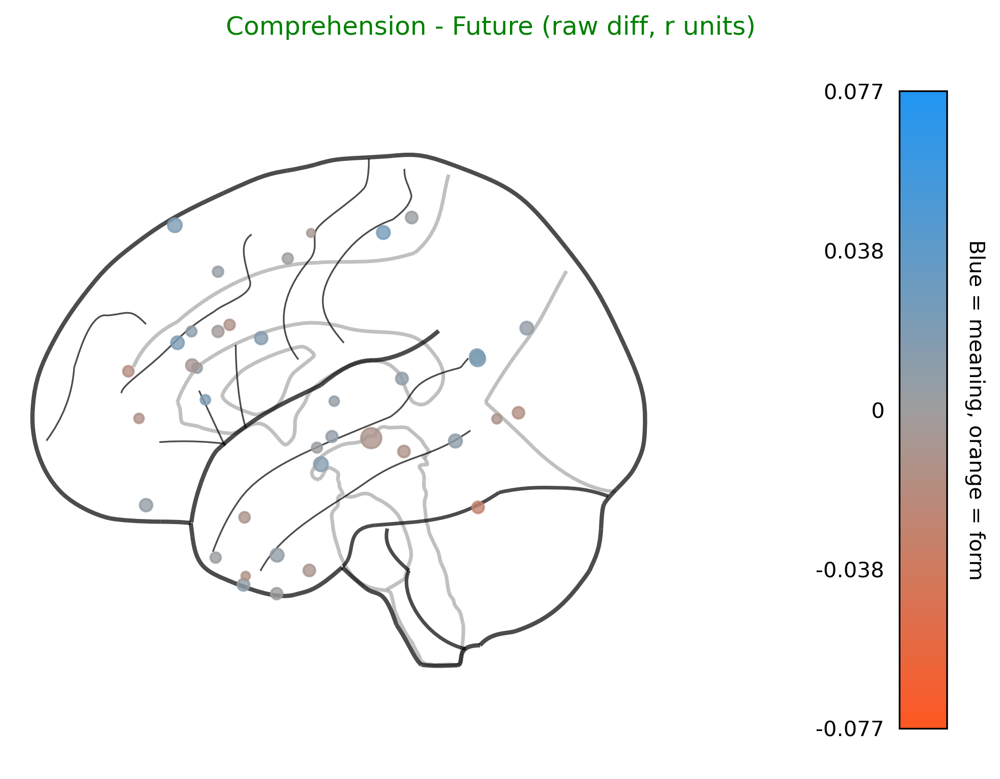

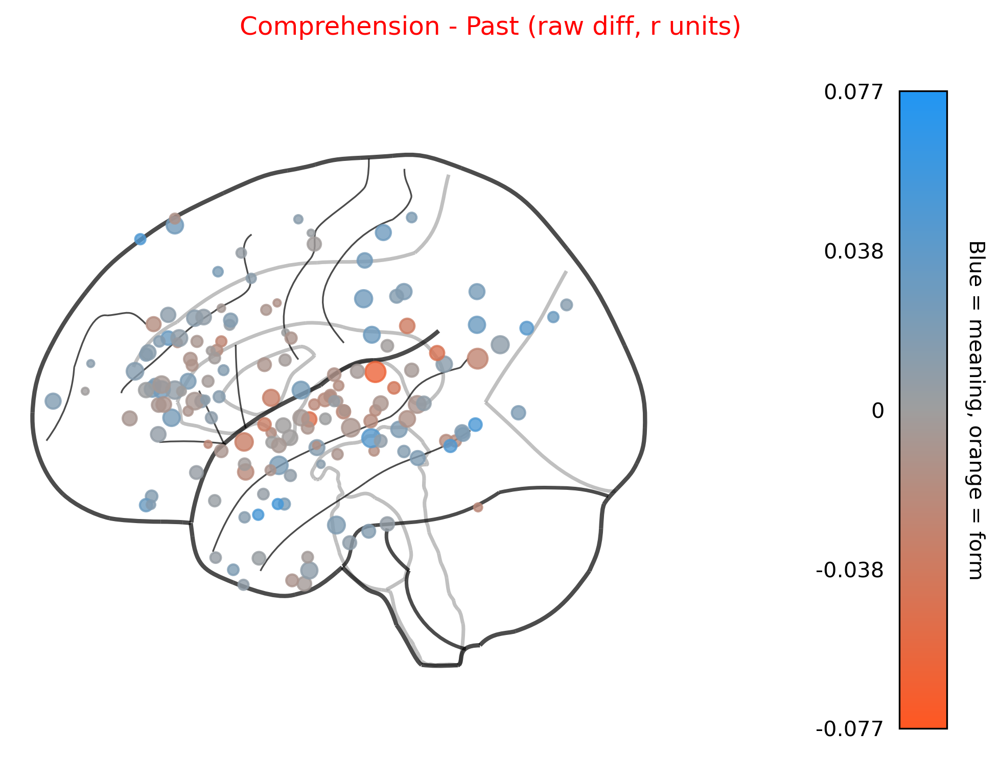

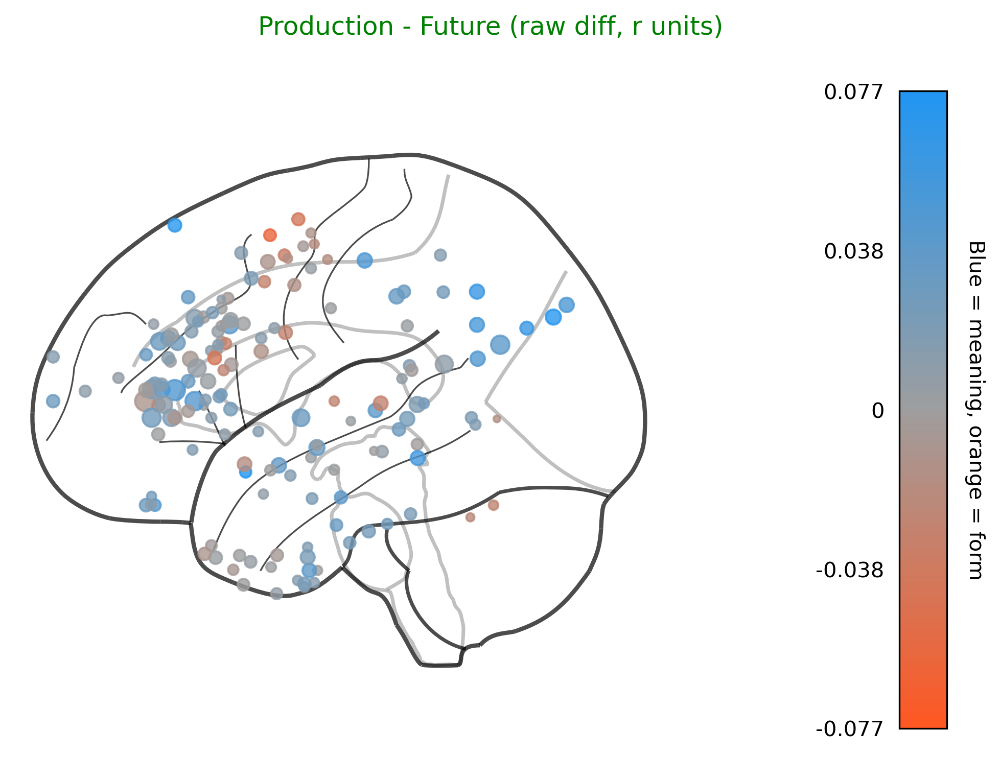

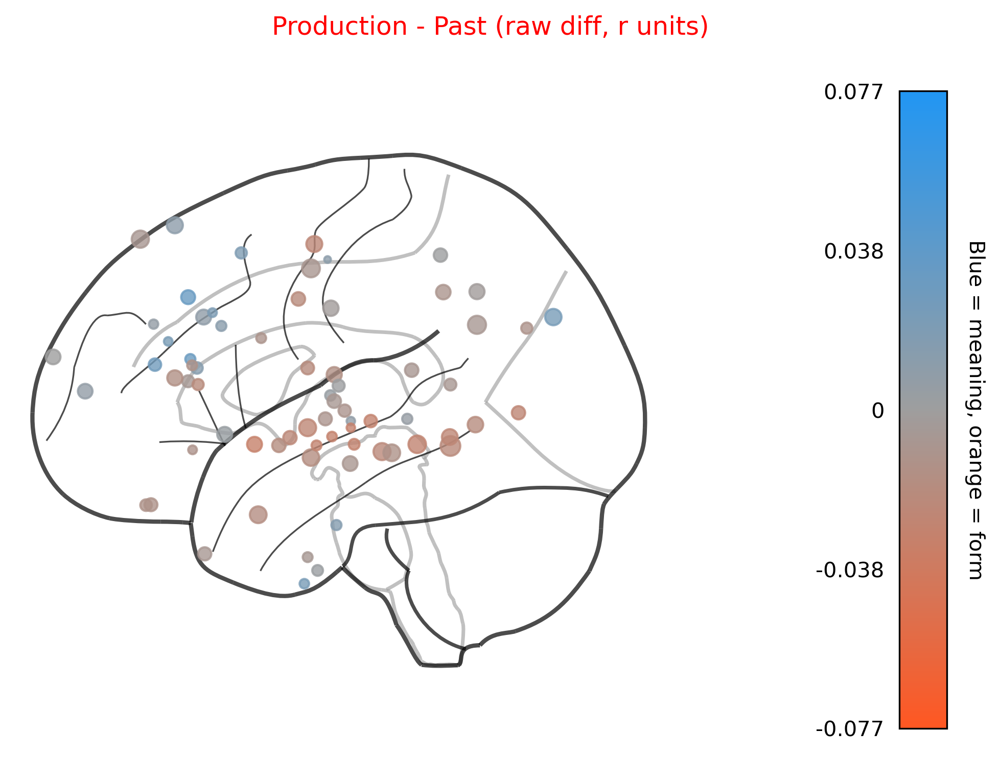

In [12]:
importlib.reload(ru)

ru.render_raw_diff_brainplots(
    electrode_scores=electrode_scores_parandom,
    plot_order=plot_order,
    cmaps=cmaps,
    colorbar_labels=colorbar_labels,
    use_size_encoding=True,
)